# Visualization: <font color='yellow'> Letting the Data Speak for Itself </font>

### Imports & SparkSession 

In [1]:
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import matplotlib.pyplot as plt
import os
from DataPreparation import read_data, prior_class_distribution, feature_histograms_analysis, mix_correlation_matrix, convey_insights
from DataPreparation import numerical_correlation_matrix, NaiveBayesTest, visualize_continuous_data, visualize_categorical_data

spark = SparkSession.builder.appName("AirlineSatisfaction").getOrCreate()
sc = spark.sparkContext                                                     # shorthand

Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
23/04/20 01:45:13 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


### Reading the Data

In [2]:
x_data, y_data = read_data(split='train', scales=['numerical', 'categorical', 'ordinal'], encode=False)
x_data.toPandas().head()

,Age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Gender,Customer Type,Type of Travel,Class,Inflight wifi service,Departure/Arrival time convenient,...,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness
0,13,460,25,18.0,Male,Loyal Customer,Personal Travel,Eco Plus,3,4,...,5,3,5,5,4,3,4,4,5,5
1,25,235,1,6.0,Male,disloyal Customer,Business travel,Business,3,2,...,1,3,1,1,1,5,3,1,4,1
2,26,1142,0,0.0,Female,Loyal Customer,Business travel,Business,2,2,...,5,5,5,5,4,3,4,4,4,5
3,25,562,11,9.0,Female,Loyal Customer,Business travel,Business,2,5,...,2,2,2,2,2,5,3,1,4,2
4,61,214,0,0.0,Male,Loyal Customer,Business travel,Business,3,3,...,4,5,5,3,3,4,4,3,3,3


## <font color='yellow'> Univariate Analysis </font>

### I. Prior Class Distribution

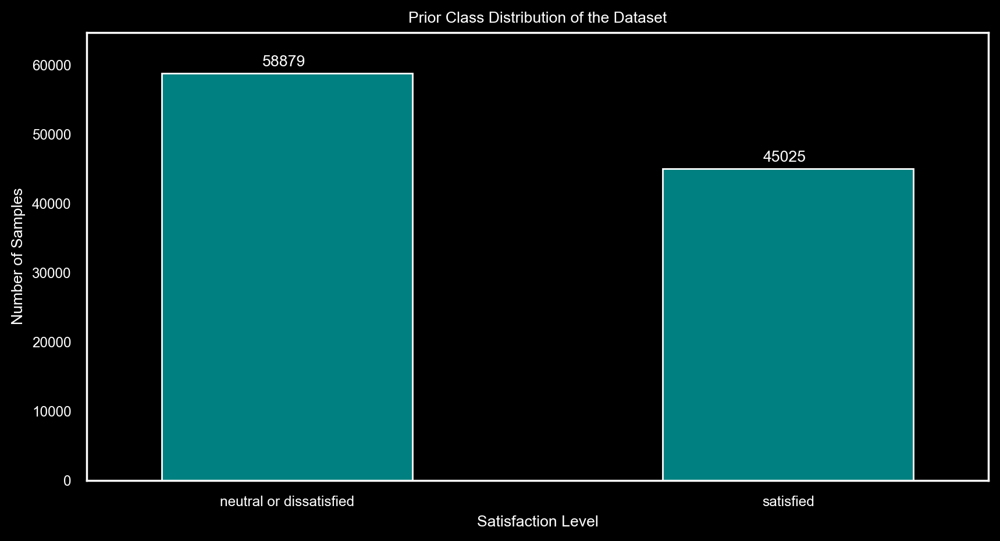

<h3><font color="pink" size=5>Insights</font></h3> <font size=4>
<font color="pink">✦</font> It seems that the majority of customers surveyed where potentially unsatisfied which makes work on this
    even more consequential.
    <br><font color="pink">✦</font> There is no severe imbalance. Machine learning models should be able to handle this as it is<br></font>

In [14]:
prior_class_distribution(y_data)

convey_insights([
    '''It seems that the majority of customers surveyed where potentially unsatisfied which makes work on this
    even more consequential.
    ''',
    '''There is no severe imbalance. Machine learning models should be able to handle this as it is'''
])

### II. Feature Distributions

<h3><font color="pink" size=5>Insights</font></h3> <font size=4>
<font color="pink">✦</font> Genders are equally represented through the dataset which is good<br><font color="pink">✦</font> The dataset seems to emphasize business travellers; meanwhile, personal travellers are expected to be more common in the real world<br><font color="pink">✦</font> The economy plus class is underrepresented in the dataset but that matches the real world as its not always available<br><font color="pink">✦</font> It may be the case that only loyal customers where interested in taking the survey as they do outnumber disloyal ones<br><font color="pink">✦</font> Ordinal distributions are majorly classic, there is evident skew towards the higher ratings<br><font color="pink">✦</font> Age follows a bell-shaped distribution<br><font color="pink">✦</font> Departure & Arrival delat follow very similar left-skewed distributions and seem to include outliers<br></font>

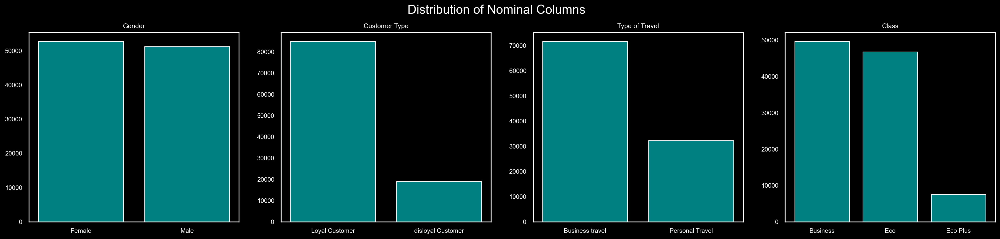

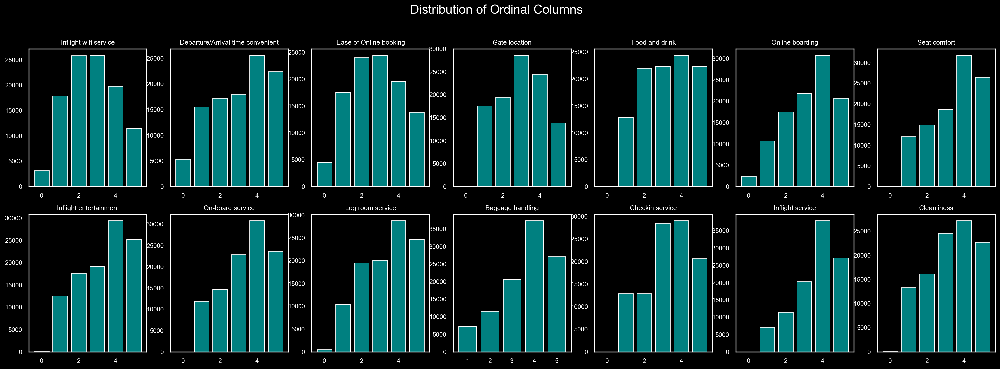

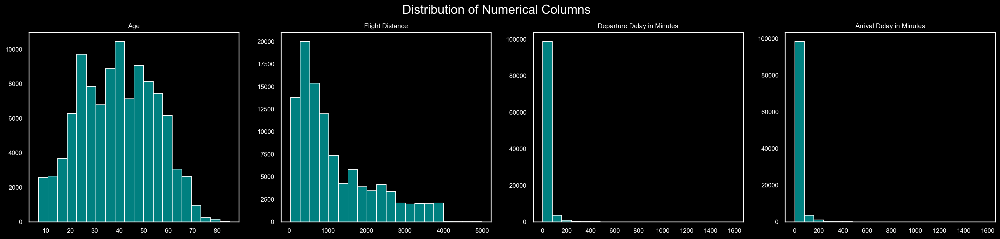

In [16]:
feature_histograms_analysis(x_data, y_data)
convey_insights([
"Genders are equally represented through the dataset which is good",
"The dataset seems to emphasize business travellers; meanwhile, personal travellers are expected to be more common in the real world",
"The economy plus class is underrepresented in the dataset but that matches the real world as its not always available",
"It may be the case that only loyal customers where interested in taking the survey as they do outnumber disloyal ones",
"Ordinal distributions are majorly classic, there is evident skew towards the higher ratings",
"Age follows a bell-shaped distribution",
"Departure & Arrival delat follow very similar left-skewed distributions and seem to include outliers"
])

### III. Feature Distributions per Class

<h3><font color="pink" size=5>Insights</font></h3> <font size=4>
<font color="pink">✦</font> A huge majority of personal travellers are potentially dissatisfied so they may need more focus<br><font color="pink">✦</font> As it logically follows, a huge majority of economy travellers are potentially dissatisfied<br><font color="pink">✦</font> Its obvious that many of those that have done online boarding where potentially dissatisfied<br><font color="pink">✦</font> Departure and arrival delay are noticable for the dissatisfied class<br></font>

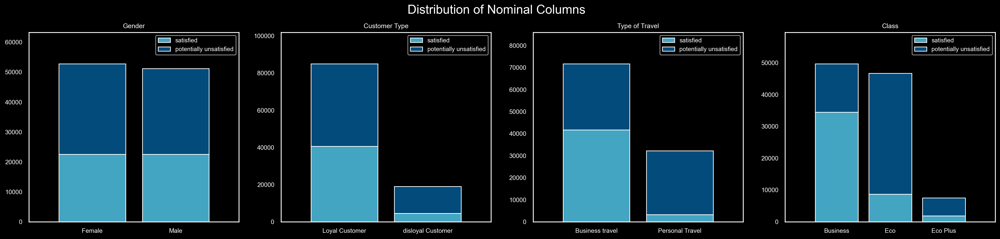

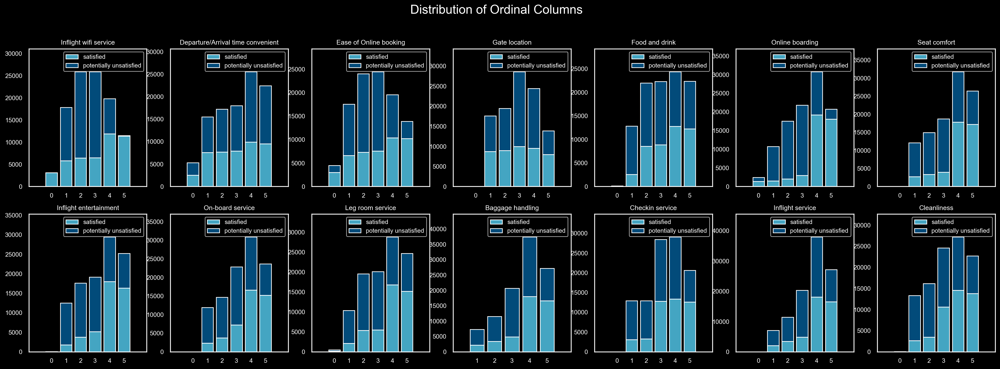

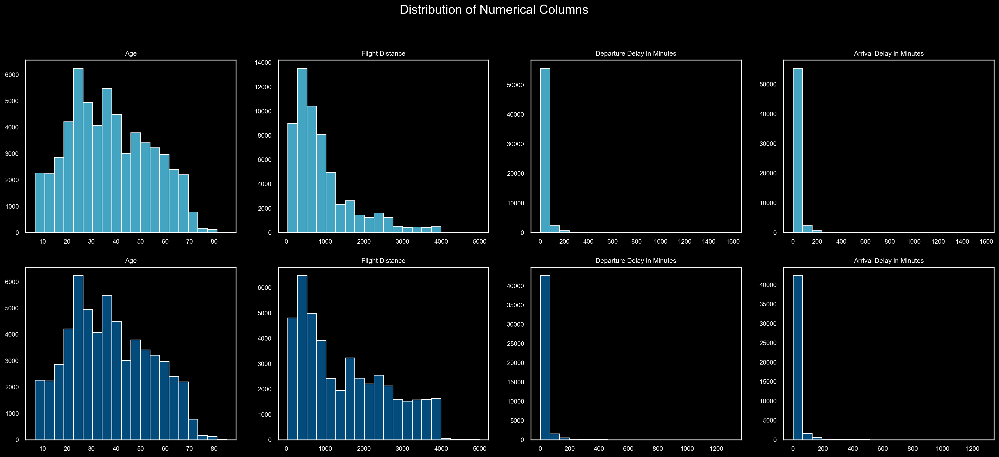

In [17]:
feature_histograms_analysis(x_data, y_data, per_class=True)
convey_insights([
    "A huge majority of personal travellers are potentially dissatisfied so they may need more focus",
    "As it logically follows, a huge majority of economy travellers are potentially dissatisfied",
    "Its obvious that many of those that have done online boarding where potentially dissatisfied",
    "Departure and arrival delay are noticable for the dissatisfied class",
])

## <font color='yellow'> Correlations </font>

### I. Correlations between Nominal & Numerical Features

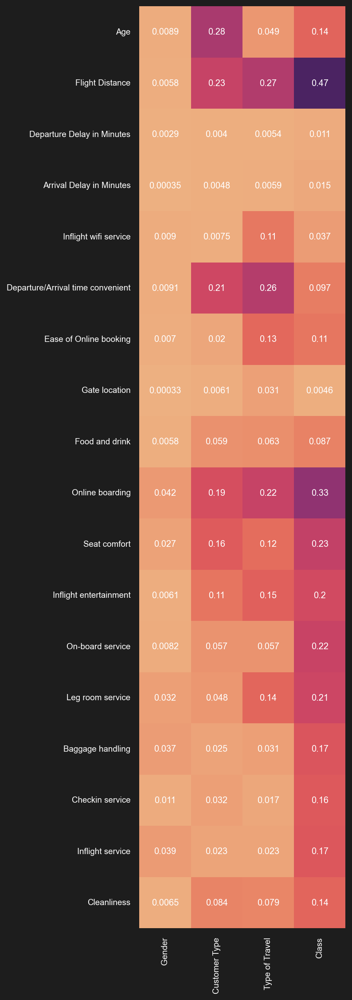

<h3><font color="pink" size=5>Insights</font></h3> <font size=4>
<font color="pink">✦</font> There is a strong association between the class and flight distance; in other words, knowing the flight distance
tells us something about the class<br><font color="pink">✦</font> In general, class seems to have extraordinary associations with most ratings. They are perhaps more likely to give better ratings<br><font color="pink">✦</font> Likewise, knowing the age tells us something about the customer type. Most business travellers would be young<br><font color="pink">✦</font> Gender seems to have no strong associations with anything<br></font>

In [18]:
mix_correlation_matrix(x_data)
convey_insights([
'''There is a strong association between the class and flight distance; in other words, knowing the flight distance
tells us something about the class''',
"In general, class seems to have extraordinary associations with most ratings. They are perhaps more likely to give better ratings",
"Likewise, knowing the age tells us something about the customer type. Most business travellers would be young",
"Gender seems to have no strong associations with anything"
])

### II. Correlations between Numerical Features

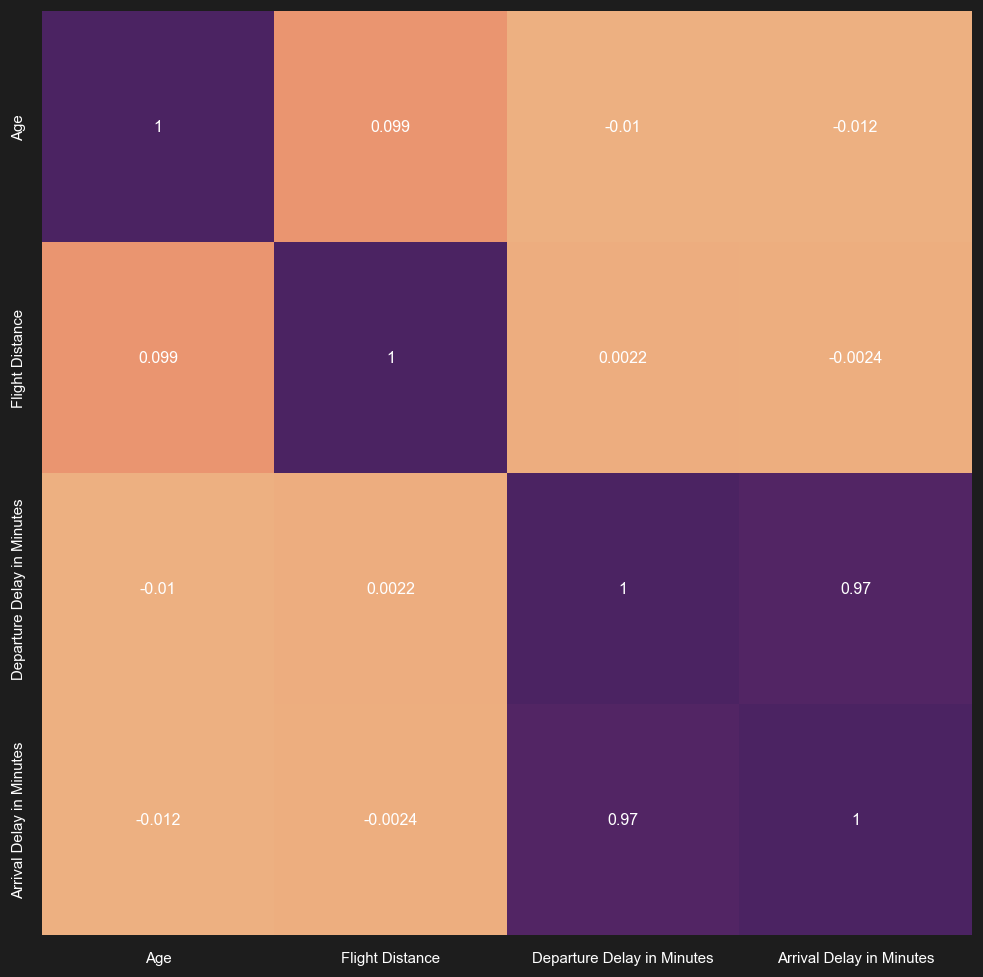

<h3><font color="pink" size=5>Insights</font></h3> <font size=4>
<font color="pink">✦</font> Numerical variables are mostly uncorrelated<br><font color="pink">✦</font> There is an extreme exception. It holds that the arrival and departure delay are almost perfectly correlated<br><font color="pink">✦</font> Notice that in this, we only consider linear correlations.<br></font>

In [19]:
numerical_correlation_matrix(x_data)
convey_insights([
    "Numerical variables are mostly uncorrelated",
    "There is an extreme exception. It holds that the arrival and departure delay are almost perfectly correlated",
    "Notice that in this, we only consider linear correlations."
])

### III. Naive Bayes Assumption

In [8]:
columns_vals = dict([('Gender', 'Male'), ('Inflight wifi service', 3)  ])

NaiveBayesTest(x_data, y_data, columns_vals)

<font size=4> As expected, the Naive Bayes assumption does not hold. In particular, we have that
                    $$P(x_1, x_2, ...|C_1=0)=0.16$$ 
                    as computed numerically using the definition of the probability.
                    Meanwhile, applying the Naive Bayes assumption we have that
                    $$P(x_1, x_2, ...|C_1=0)=P(x_1|C_1=0)P(x_2|C_1=0)...=0.08$$ 
                    which is different from the correct probability.
                    

Likewise, for the class $C_1=1$ we have that
                    $$P(x_1, x_2, ...|C_1=1)=0.07$$ 
                    but 
                    $$P(x_1, x_2, ...|C_1=1)=P(x_1|C_1=1)P(x_2|C_1=1)...=0.04$$ 
                    which is different from the correct probability.
                    </font>
                    

## <font color='yellow'> Multivariate Analysis </font>

### I. Seperability & Distribution of Numerical Pairs

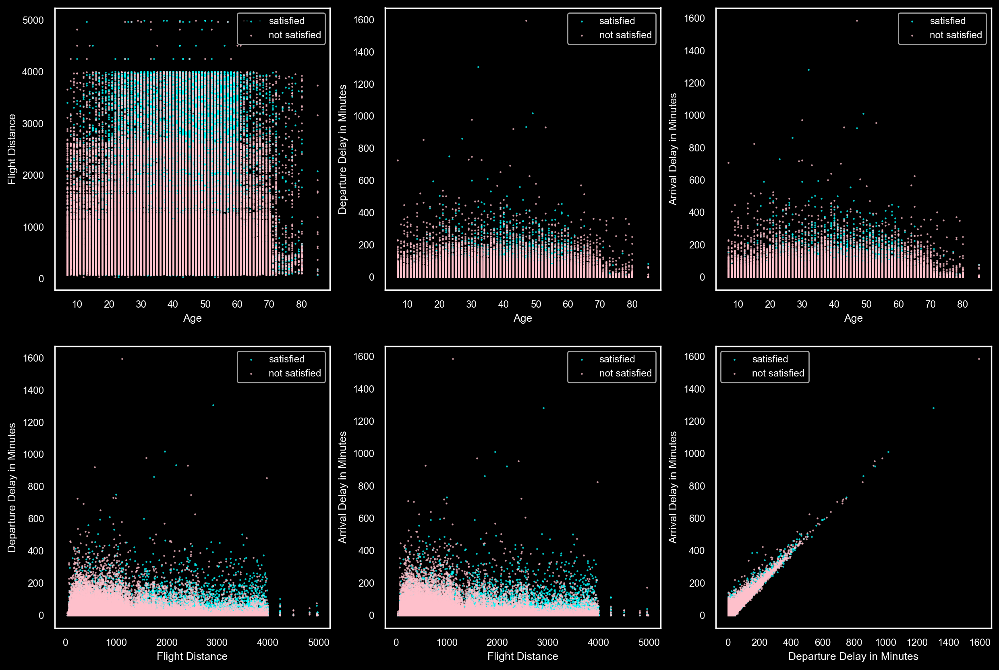

<h3><font color="pink" size=5>Insights</font></h3> <font size=4>
<font color="pink">✦</font> Overall, linear seperability is not very good over numerical predictors<br><font color="pink">✦</font> Extreme correlation between departure and arrival time shows up again in the 6th plot<br><font color="pink">✦</font> The correlation between them is also evident in how the plot of each with age looks likeThe non-linearity evident is not even obvious fromt the plots. The data complexity is not low<br></font>

In [20]:
visualize_continuous_data(x_data, y_data)
convey_insights([
    "Overall, linear seperability is not very good over numerical predictors",
    "Extreme correlation between departure and arrival time shows up again in the 6th plot",
    "The correlation between them is also evident in how the plot of each with age looks like"
    "The non-linearity evident is not even obvious fromt the plots. The data complexity is not low"
])

### II. Seperability & Distribution of Numerical Trios

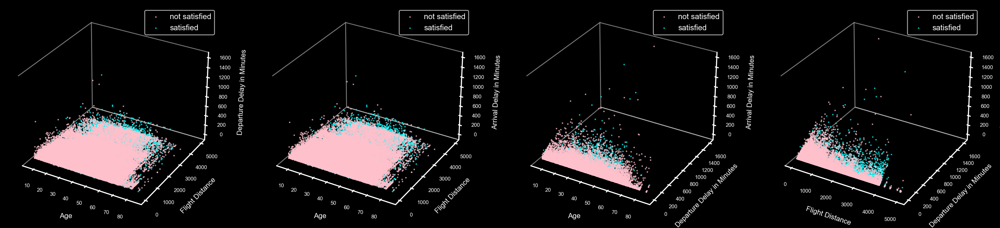

<h3><font color="pink" size=5>Insights</font></h3> <font size=4>
<font color="pink">✦</font> Seperability issues persist in higher dimensions and colinearity is again obvious between delay<br></font>

In [21]:
visualize_continuous_data(x_data, y_data, HighD=True)
convey_insights([
    "Seperability issues persist in higher dimensions and colinearity is again obvious between delay",
])

### III. Seperability & Distribution of Categorical Pairs

In [3]:
visualize_categorical_data(x_data, y_data)
convey_insights([
    "The dark color evident over most of the plots inspire that there are many associations to learn",
    "The fact that many of those have very high or very low satisfaction rates also shedes light on that there is much to learn",
    "Manual insights may be also derived using the same fact."
])

<h3><font color="pink" size=5>Insights</font></h3> <font size=4>
<font color="pink">✦</font> The dark color evident over most of the plots inspire that there are many associations to learn<br><font color="pink">✦</font> The fact that many of those have very high or very low satisfaction rates also shedes light on that there is much to learn<br><font color="pink">✦</font> Manual insights may be also derived using the same fact.<br></font>

<h1 align='center'> <font color="pink"> Thanks </font> </h1>